# Final Capstone Project for IBM Data Science Course

By Diego Kaleb Samano Rodriguez\
On August 24, 2020\
At Culiacan, Sinaloa, Mexico

## Description of the problem and background:
For this final project I chose to use the sample data set provided by the course which contains various registries (194,673 in total) of car accidentes that ocurred in the city of Seattle, Washington between the years 2004 and 2020.
\
\
Seattle is a big city located in the Northwestern part of the United States, the Seattle Metropolitan Area has a population of 3,263,497 habitants. The city has gained the reputation of 'Rain City' because the of the constant precipitation it has all year long. This climatological characteristic and its population size makes the city a very interesting study object for car accidents.
\
\
The goal for this project is to utilize and put into practice the knowledges obtained throughout the course in order to develop a supervised machine learning model(s) that will try predict the severity of the car accident taking into account the most meaningful values of the different attributes that each accident registry has in the dataset, this in order to find a direct or indirect correlation between them and the severity value.

## Data description:
As it was mentioned before, the dataset used contains a total of 194673 registries of car accidents that ocurred in the city of Seattle between the years 2004 and 2020. In this section we will analyze and study the data in order to get a better understanding of the problem.

The first thing we need to do is to import the initial required libraries in order to read and study the data. We import the Pandas and Numpy and Pandas libraries.

In [72]:
#import Pandas and NumPy libraries
import pandas as pd
import numpy as np

Using the Pandas library we read the data csv and assign it to the variable data.

In [73]:
data = pd.read_csv('Data-Collisions.csv')

/Users/kalebsamano/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


We verify the data the csv file was succesfully read.

In [74]:
data.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,l,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


The code below displays us the dimentions of our data frame, it has a total of 38 columns and 194673 rows.

In [75]:
data.shape

(194673, 38)

Now we obtain the names of the columns of the dataset, as we can see some names are difficult to interpret so we will rename and drop the ones that will not be useful to product severity.

In [76]:
#total number of columns in data frame
data.columns

Index(['SEVERITYCODE', 'X', 'Y', 'OBJECTID', 'INCKEY', 'COLDETKEY', 'REPORTNO',
       'STATUS', 'ADDRTYPE', 'INTKEY', 'LOCATION', 'EXCEPTRSNCODE',
       'EXCEPTRSNDESC', 'SEVERITYCODE.1', 'SEVERITYDESC', 'COLLISIONTYPE',
       'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE',
       'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC',
       'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC',
       'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR'],
      dtype='object')

In [77]:
#drop unnecessary columns
data.drop(['INCKEY','COLDETKEY','REPORTNO','INTKEY','EXCEPTRSNCODE','EXCEPTRSNDESC',
           'INCDTTM','PEDROWNOTGRNT','SDOTCOLNUM','SEGLANEKEY','CROSSWALKKEY',
           'SEVERITYCODE.1','PEDROWNOTGRNT','SDOTCOLNUM','INATTENTIONIND'], axis=1, inplace=True)


In [78]:
#verify that columns were dropped
data.columns

Index(['SEVERITYCODE', 'X', 'Y', 'OBJECTID', 'STATUS', 'ADDRTYPE', 'LOCATION',
       'SEVERITYDESC', 'COLLISIONTYPE', 'PERSONCOUNT', 'PEDCOUNT',
       'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE', 'JUNCTIONTYPE', 'SDOT_COLCODE',
       'SDOT_COLDESC', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND',
       'SPEEDING', 'ST_COLCODE', 'ST_COLDESC', 'HITPARKEDCAR'],
      dtype='object')

In [79]:
#data frame new shape
data.shape

(194673, 25)

'PEDCOUNT','PEDCYLCOUNT'

Now we rename the columns we have left in the dataframe

In [80]:
data.head()

,SEVERITYCODE,X,Y,OBJECTID,STATUS,ADDRTYPE,LOCATION,SEVERITYDESC,COLLISIONTYPE,PERSONCOUNT,...,SDOT_COLCODE,SDOT_COLDESC,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,SPEEDING,ST_COLCODE,ST_COLDESC,HITPARKEDCAR
0,2,-122.323148,47.703140,1,Matched,Intersection,5TH AVE NE AND NE 103RD ST,Injury Collision,Angles,2,...,11,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",N,Overcast,Wet,Daylight,NaN,10,Entering at angle,N
1,1,-122.347294,47.647172,2,Matched,l,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,Property Damage Only Collision,Sideswipe,2,...,16,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE ...",0,Raining,Wet,Dark - Street Lights On,NaN,11,From same direction - both going straight - bo...,N
2,1,-122.334540,47.607871,3,Matched,Block,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,Property Damage Only Collision,Parked Car,4,...,14,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END",0,Overcast,Dry,Daylight,NaN,32,One parked--one moving,N
3,1,-122.334803,47.604803,4,Matched,Block,2ND AVE BETWEEN MARION ST AND MADISON ST,Property Damage Only Collision,Other,3,...,11,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",N,Clear,Dry,Daylight,NaN,23,From same direction - all others,N
4,2,-122.306426,47.545739,5,Matched,Intersection,SWIFT AVE S AND SWIFT AV OFF RP,Injury Collision,Angles,2,...,11,"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",0,Raining,Wet,Daylight,NaN,10,Entering at angle,N


In [82]:
#rename columns
data.rename(columns = {'OBJECTID':'object_ID','STATUS':'status','ADDRTYPE':'adress_type',
                       'LOCATION':'location', 'SEVERITYDESC': 'severity_description', 
                       'COLLISIONTYPE':'collision_type', 'PERSONCOUNT':'person_count', 
                       'VEHCOUNT':'vehicle_count', 'INCDATE':'date', 
                       'JUNCTIONTYPE': 'junction_type', 'SDOT_COLCODE':'crash_type_code', 
                       'SDOT_COLDESC':'crash_type', 'UNDERINFL':'tire_inflated',
                       'WEATHER':'weather', 'ROADCOND':'road_condition', 
                       'LIGHTCOND': 'streetlight_condition', 'SPEEDING': 'speeding', 
                       'ST_COLCODE':'crash_desc_code', 'ST_COLDESC':'crash_desc', 
                       'HITPARKEDCAR':'parked_car_crash','PEDCOUNT':'pedestrians','PEDCYLCOUNT':'bikes'}, inplace = True)

In [83]:
#verify name changes
data.columns

Index(['SEVERITYCODE', 'X', 'Y', 'object_ID', 'status', 'adress_type',
       'location', 'severity_description', 'collision_type', 'person_count',
       'pedestrians', 'bikes', 'vehicle_count', 'date', 'junction_type',
       'crash_type_code', 'crash_type', 'tire_inflated', 'weather',
       'road_condition', 'streetlight_condition', 'speeding',
       'crash_desc_code', 'crash_desc', 'parked_car_crash'],
      dtype='object')

To understand better the data frame here is a brief explanation /description of a sample registry in our data.

**Sample Registry**

SEVERITYCODE: 1 or 2\
X: x coordinate (latitude)\
Y: y coordinate (longitude)\
object_ID: id of every accident ex. 172\
status: matched or unmatched\
adress_type: intersection, block, alley etc.\
location: street where accident happened\
severity_description: brief description of crash\
collison_type: type of crash, different values\
person_count: amount of people involved\
pedestrians: amount of pedestrians involved in accident\
bikes: ampount of bikes involved in accident\
vehicle_count:amount of vehicles involved\
date: date of incident\
juntion_type: type of juntion\
crash_type_code: crash id according to type\
crash_type: description of the above attribute\
tire_inflated: tires where inflated or not\
weather: weather of accident\
road_condition: condition of road\
streetlight_condition: condition of street lights near accident\
speeding: involved cars were speeding\
crash_desc_code: code of crash according to description\
crash_desc: description of above attribute\
parked_car_crash: parked cars were crashed in accident\


Display of the different data types in the data frame

In [84]:
data.dtypes

SEVERITYCODE               int64
X                        float64
Y                        float64
object_ID                  int64
status                    object
adress_type               object
location                  object
severity_description      object
collision_type            object
person_count               int64
pedestrians                int64
bikes                      int64
vehicle_count              int64
date                      object
junction_type             object
crash_type_code            int64
crash_type                object
tire_inflated             object
weather                   object
road_condition            object
streetlight_condition     object
speeding                  object
crash_desc_code           object
crash_desc                object
parked_car_crash          object
dtype: object

## Data analysis

### Seattle area visualization using Folium library
Using the Folium library a map of Seattle will be displayed showing 10% of the total amount accidents (about 194k+) choosen randomly. The accidents will be organized by city areas, the map is interactive, you can zoom in or zoom out and see how the the map changes.

In [85]:
#!conda install -c conda-forge folium=0.5.0 --yes
import folium

print('Folium installed and imported!')

Folium installed and imported!


In [86]:
#we take a random set of rows consisting in 10% of our data set for the map to save computing value
df_incidents = data.sample(n = 19467)

#we drop the columns with NaN values in the columns: 'X', 'Y', 'collision_type'
df_incidents.dropna(subset=['X', 'Y', 'collision_type'], inplace=True)

#we convert 'collision_type' to string object 
df_incidents.collision_type = df_incidents.collision_type.astype(str)

In [87]:
#importing folium library
from folium import plugins

#set the values for the lattitude and longitude of Seattle
lat = 47.608013
long = -122.335167

# we define the variable seattle_map 
seattle_map = folium.Map(location = [lat, long], zoom_start = 12)

# mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# we loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_incidents.Y, df_incidents.X, df_incidents.collision_type):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
seattle_map

# Accident frecuency variability per year (2004-2020)

### Line graph of accident amount variability in the past 5 years (2016-2020)

In [88]:
#we import the Matplotlib library
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use(['tableau-colorblind10'])

In [89]:
#we add a year column to the df extracting the year from 'date' column
data['year'] = pd.DatetimeIndex(data['date']).year

#we add a column with value to be able to add the accidents per year
data['n'] = 1

#we use groupby function
line_data = data[['year','n']].groupby('year').sum()

Text(0.5, 0, 'Years')

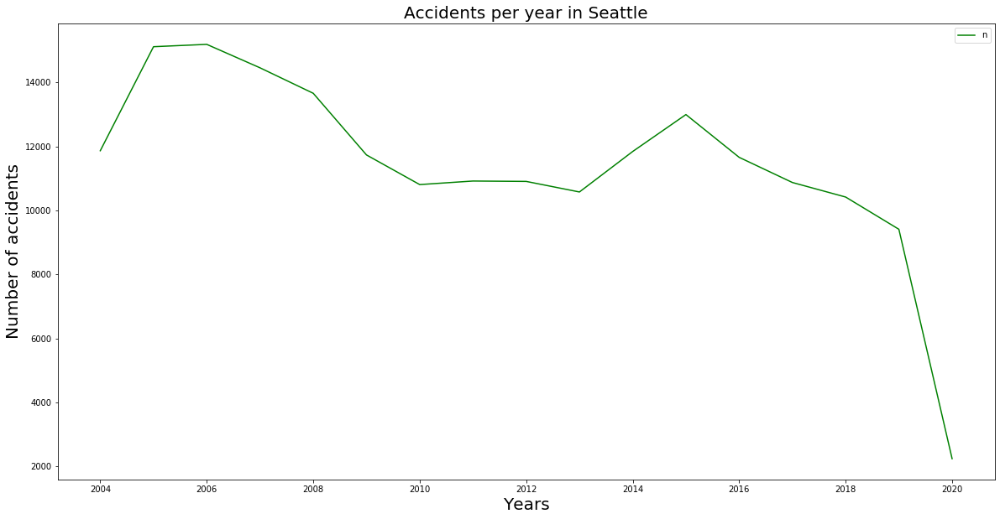

In [90]:
#line plot showing the accident tendency throughout the years
line_data.plot(kind='line', color='g', figsize=(20,10))

#plot
plt.title('Accidents per year in Seattle',size=20)
plt.ylabel('Number of accidents', size=20)
plt.xlabel('Years', size=20)

The above graph shows how the amount of accidents in Seattle has changed in the past five years

### Bar graph of the collision type distribution per year (2016-2020)

In [91]:
#we create a data frame that contains the collision types in the past decade

#we add in past_five dataframe only the data from 2016-2020 using a list validation
past_five_bar = data[['collision_type','year','n']]
years = [2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020]
past_five_bar.year.isin(years)
past_five_bar= past_five_bar[past_five_bar.year.isin(years)]

#we pivot the table in order to have a better visualization
past_five_bar = past_five_bar.groupby(['year','collision_type'])['n'].sum().unstack()
past_five_bar

collision_type,Angles,Cycles,Head On,Left Turn,Other,Parked Car,Pedestrian,Rear Ended,Right Turn,Sideswipe
year,,,,,,,,,,
2010,2004,333,112,841,1181,2820,436,1879,166,1034
2011,1924,332,89,870,1118,3165,340,1865,216,1000
2012,2033,339,128,844,1133,2272,389,1950,176,981
2013,2015,369,114,730,1095,2251,346,1914,153,990
2014,2053,395,124,894,1175,3120,418,2098,215,1140
2015,2254,437,135,857,1242,3811,442,2178,179,1285
2016,2247,380,144,794,1243,2229,453,2129,175,1157
2017,2196,345,129,807,1180,1981,432,2007,205,1206
2018,2093,337,132,753,1109,2028,446,1787,178,1037


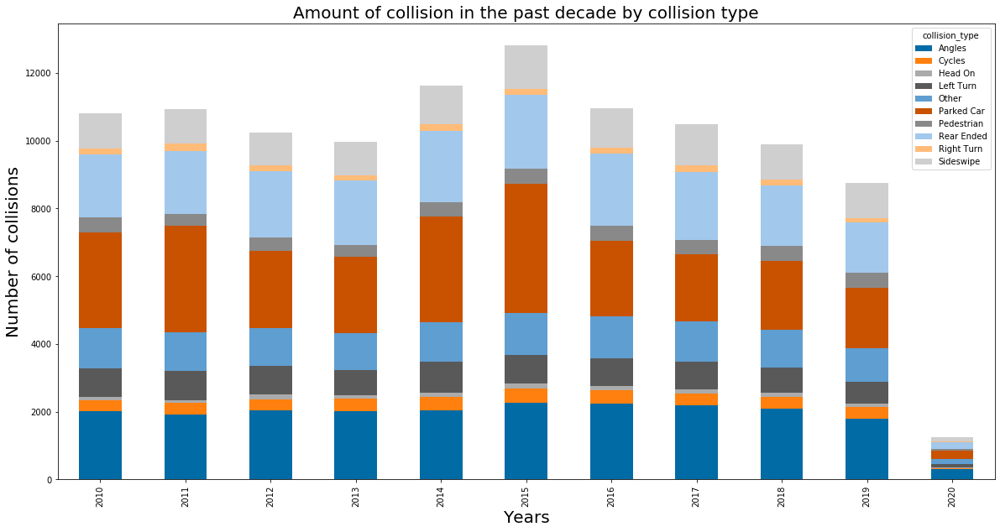

In [92]:
#we plot the data as bar graph
past_five_bar.plot(kind='bar', figsize=(20,10), stacked=True)
plt.title('Amount of collision in the past decade by collision type', size=20)
plt.ylabel('Number of collisions', size=20)
plt.xlabel('Years', size=20)
plt.show()

#we can see that the collision type distribution of incidents remains fairly constant in every year
#there is a decline in the total amount of car collisions in every year, 
#to the coronavirus pandemic 2020 decreased a lot due 


In [93]:
#we create a data frame that contains collisions by adress type in the past decade

#we add in past_five dataframe only the data from 2010-2020 using a list validation
w_bar = data[['adress_type','year','n']]
years = [2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020]
w_bar.year.isin(years)
w_bar= w_bar[w_bar.year.isin(years)]

#we pivot the table in order to have a better visualization
w_bar = w_bar.groupby(['year','adress_type'])['n'].sum().unstack()
w_bar

adress_type,Alley,Block,Intersection
year,,,
2010,30,6606,4080
2011,31,7220,3535
2012,34,6969,3792
2013,22,6640,3807
2014,42,7917,3701
2015,45,8990,3599
2016,27,7566,3928
2017,42,6479,4256
2018,32,6166,4191


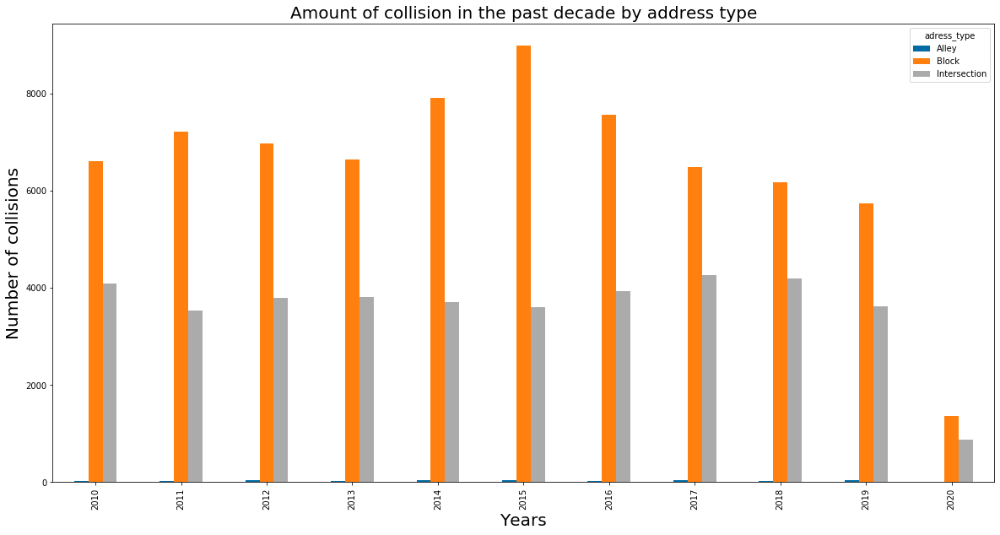

In [94]:
#we plot the data as bar graph
w_bar.plot(kind='bar', figsize=(20,10))
plt.title('Amount of collision in the past decade by address type', size=20)
plt.ylabel('Number of collisions', size=20)
plt.xlabel('Years', size=20)
plt.show()

## Machine learning model

In [95]:
#we import the required libraries for building our model
import pylab as pl
import scipy.optimize as opt
from sklearn import preprocessing
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import classification_report

In [96]:
data2 = data
years = [2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020]
data2.year.isin(years)
data2= data2[data2.year.isin(years)]

In [97]:
#we get dummies for the columns that have many different string values
rcon = pd.get_dummies(data2['road_condition'],drop_first=True)
addr = pd.get_dummies(data2['adress_type'],drop_first=True)
coll = pd.get_dummies(data2['collision_type'],drop_first=True)

#we define mldata df from the data df, using the columns that will help us build our model to predict the seveiry
mldata = data2[['SEVERITYCODE','person_count','pedestrians','bikes','tire_inflated','speeding']]
mldata = pd.concat([mldata,rcon, addr, coll], axis=1)

#replace values for 1 and 0
mldata['speeding'] = mldata['speeding'].fillna(0)
mldata['speeding']= mldata['speeding'].replace('Y',1)
mldata

,SEVERITYCODE,person_count,pedestrians,bikes,tire_inflated,speeding,Ice,Oil,Other,Sand/Mud/Dirt,...,Intersection,Cycles,Head On,Left Turn,Other,Parked Car,Pedestrian,Rear Ended,Right Turn,Sideswipe
0,2,2,0,0,N,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,1,3,0,0,N,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,1,2,0,0,N,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
7,2,3,0,1,N,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
14,2,2,0,0,N,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194668,2,3,0,0,N,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
194669,1,2,0,0,N,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
194670,2,3,0,0,N,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
194671,2,2,0,1,N,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0


This is the df we will use to build our ml model.

In [98]:
#we put into variable X the attributes that we want to use to predict the severity code
X = np.asarray(mldata[['person_count','pedestrians','bikes','speeding','Ice','Oil','Other','Sand/Mud/Dirt','Snow/Slush',
                       'Standing Water','Unknown','Wet','Block','Intersection','Cycles', 
                       'Head On','Left Turn', 'Other','Parked Car','Pedestrian','Rear Ended',
                       'Right Turn','Sideswipe' ]])

#we put into variable y the what we want to predict, in this case the severity code of the accident
y = np.asarray(mldata['SEVERITYCODE'])

In [99]:
#we normalize the data
X = preprocessing.StandardScaler().fit(X).transform(X)
X[0:5]

array([[-0.28693259, -0.1967649 , -0.18439949, -0.20625704, -0.06311635,
        -0.0171177 , -0.02475611, -0.33900055, -0.01576732, -0.06261824,
        -0.02308427, -0.29035402,  1.75371065, -1.32167015,  1.36386769,
        -0.18316952, -0.10471977, -0.27911321, -0.02475611, -0.33900055,
        -0.54389651, -0.19678856, -0.45742505, -0.12753403, -0.32895158],
       [ 0.44035711, -0.1967649 , -0.18439949, -0.20625704, -0.06311635,
        -0.0171177 , -0.02475611,  2.94984776, -0.01576732, -0.06261824,
        -0.02308427, -0.29035402, -0.57021949,  0.75661843, -0.73320895,
        -0.18316952, -0.10471977, -0.27911321, -0.02475611,  2.94984776,
        -0.54389651, -0.19678856, -0.45742505, -0.12753403, -0.32895158],
       [-0.28693259, -0.1967649 , -0.18439949, -0.20625704, -0.06311635,
        -0.0171177 , -0.02475611, -0.33900055, -0.01576732, -0.06261824,
        -0.02308427, -0.29035402, -0.57021949, -1.32167015,  1.36386769,
        -0.18316952, -0.10471977, -0.27911321, -0

In [100]:
#we create the training and testing variables for our model
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (90124, 25) (90124,)
Test set: (22531, 25) (22531,)


In [101]:
#logistic regression model
LR = LogisticRegression(C=0.02, solver='liblinear').fit(X_train,y_train)
LR

LogisticRegression(C=0.02, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [102]:
yhat = LR.predict(X_test)
print(yhat)

yhat_prob = LR.predict_proba(X_test)
print(yhat_prob)

[1 1 1 ... 1 1 1]
[[0.98184531 0.01815469]
 [0.8828707  0.1171293 ]
 [0.73806608 0.26193392]
 ...
 [0.87541909 0.12458091]
 [0.52987326 0.47012674]
 [0.61693265 0.38306735]]


In [103]:
jaccard_similarity_score(y_test, yhat)

/Users/kalebsamano/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:664: FutureWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  FutureWarning)


0.7522080688828725

In [104]:
print (classification_report(y_test, yhat))

              precision    recall  f1-score   support

           1       0.75      0.96      0.84     15606
           2       0.77      0.28      0.41      6925

    accuracy                           0.75     22531
   macro avg       0.76      0.62      0.62     22531
weighted avg       0.76      0.75      0.71     22531

